## About

This starter code shows how to read slides and tumor masks from the [CAMELYON16](https://camelyon17.grand-challenge.org/Data/) dataset. It will install [OpenSlide](https://openslide.org/) in Colab (the only non-Python dependency). Note that OpenSlide also includes a [DeepZoom viewer](https://github.com/openslide/openslide-python/tree/master/examples/deepzoom), shown in class. To use that, you'll need to install and run OpenSlide locally on your computer.

### Training data

The original slides and annotations are in an unusual format. I converted a bunch of them for you, so you can read them with OpenSlide as shown in this notebook. This [folder](https://drive.google.com/drive/folders/1rwWL8zU9v0M27BtQKI52bF6bVLW82RL5?usp=sharing) contains all the slides and tumor masks I converted (and these should be *plenty* for your project). If you'd like more beyond this, you'll need to use ASAP as described on the competition website to convert it into an appropriate format. 

Note that even with the starter code, it will take some effort to understand how to work with this data (the various zoom levels, and the coordinate system). Happy to help if you're stuck (please catch me in office hours, or right after class).

### Goals and grading

The goal for your project is to build a thoughtful, end-to-end prototype - not to match the accuracy from the [paper](https://arxiv.org/abs/1703.02442), and not necessarily to use all the available data. To receive an A on this work, your project should (for example):
- Use multiple zoom levels
- Use high-magnification images
- Include several visualizations of your results (both heatmaps showing predictions on individual slides, and other metrics/diagrams you design that are appropriate to communicate how well your model performs).

You are also welcome to propose a custom project of similar scope, happy to chat with you about your ideas anytime.

In [4]:
# Install the OpenSlide C library and Python bindings
# After installing these libraries, use `Runtime -> restart and run all` on the menu
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-2).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.


In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray
import tensorflow as tf
from PIL import Image
from matplotlib import cm
import pathlib
import random

In [6]:
# Download an example slide and tumor mask

# Note: the remainder of the training data are in the Google Drive folder linked above.
# You will need to host them on your own, either in Google Drive, or by using
# the cloud provider of your choice.

slide_path = 'tumor_091.tif' # only this file is available
tumor_mask_path = 'tumor_091_mask.tif' # only this file is available

slide_url = 'https://storage.googleapis.com/applied-dl/%s' % slide_path
mask_url = 'https://storage.googleapis.com/applied-dl/%s' % tumor_mask_path

# Download the whole slide image
if not os.path.exists(slide_path):
  !curl -O $slide_url

# Download the tumor mask
if not os.path.exists(tumor_mask_path):
  !curl -O $mask_url

In [7]:
slide = open_slide(slide_path)
print ("Read WSI from %s with width: %d, height: %d" % (slide_path, 
                                                        slide.level_dimensions[0][0], 
                                                        slide.level_dimensions[0][1]))

tumor_mask = open_slide(tumor_mask_path)
print ("Read tumor mask from %s" % (tumor_mask_path))

print("Slide includes %d levels", len(slide.level_dimensions))
for i in range(len(slide.level_dimensions)):
    print("Level %d, dimensions: %s downsample factor %d" % (i, 
                                                             slide.level_dimensions[i], 
                                                             slide.level_downsamples[i]))
    assert tumor_mask.level_dimensions[i][0] == slide.level_dimensions[i][0]
    assert tumor_mask.level_dimensions[i][1] == slide.level_dimensions[i][1]

# Verify downsampling works as expected
width, height = slide.level_dimensions[7]
assert width * slide.level_downsamples[7] == slide.level_dimensions[0][0]
assert height * slide.level_downsamples[7] == slide.level_dimensions[0][1]

Read WSI from tumor_091.tif with width: 61440, height: 53760
Read tumor mask from tumor_091_mask.tif
Slide includes %d levels 8
Level 0, dimensions: (61440, 53760) downsample factor 1
Level 1, dimensions: (30720, 26880) downsample factor 2
Level 2, dimensions: (15360, 13440) downsample factor 4
Level 3, dimensions: (7680, 6720) downsample factor 8
Level 4, dimensions: (3840, 3360) downsample factor 16
Level 5, dimensions: (1920, 1680) downsample factor 32
Level 6, dimensions: (960, 840) downsample factor 64
Level 7, dimensions: (480, 420) downsample factor 128


In [8]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

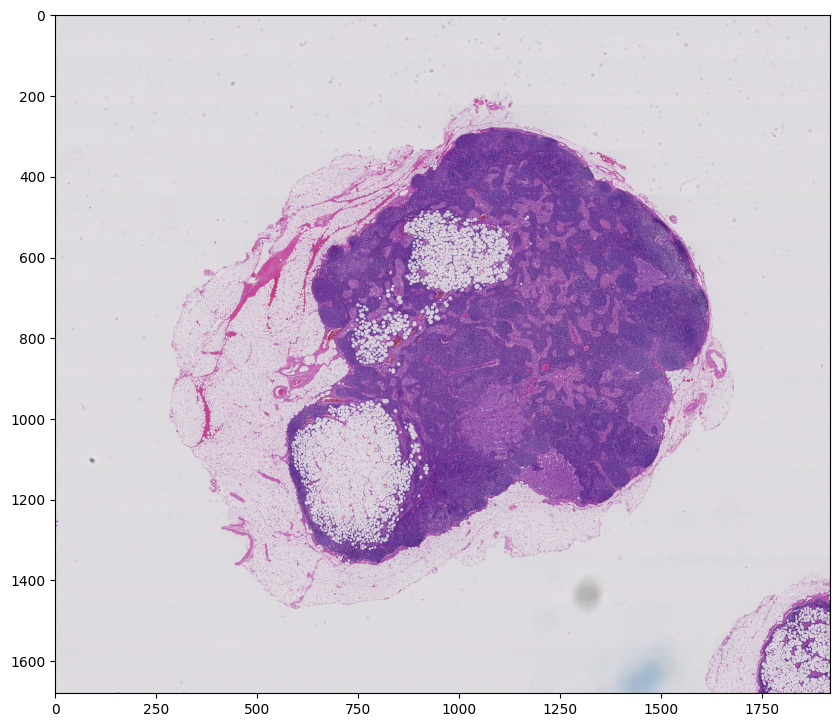

In [9]:
# Example: read the entire slide at level 5

# Higher zoom levels may not fit into memory.
# You can use the below function to extract regions from higher zoom levels 
# without having to read the entire image into ram.

# Use the sliding window approach discussed in class to collect training
# data for your classifier. E.g., slide a window across the slide (for
# starters, use a zoomed out view, so you're not working with giant images).
# Save each window to disk as an image. To find the label for that image, 
# check to the tissue mask to see if the same region contains cancerous cells.

# Important: this is tricky to get right. Carefully debug your pipeline before
# training your model. Start with just a single image, and a relatively 
# low zoom level.

slide_image = read_slide(slide, 
                         x=0, 
                         y=0, 
                         level=5, 
                         width=slide.level_dimensions[5][0], 
                         height=slide.level_dimensions[5][1])

plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image)

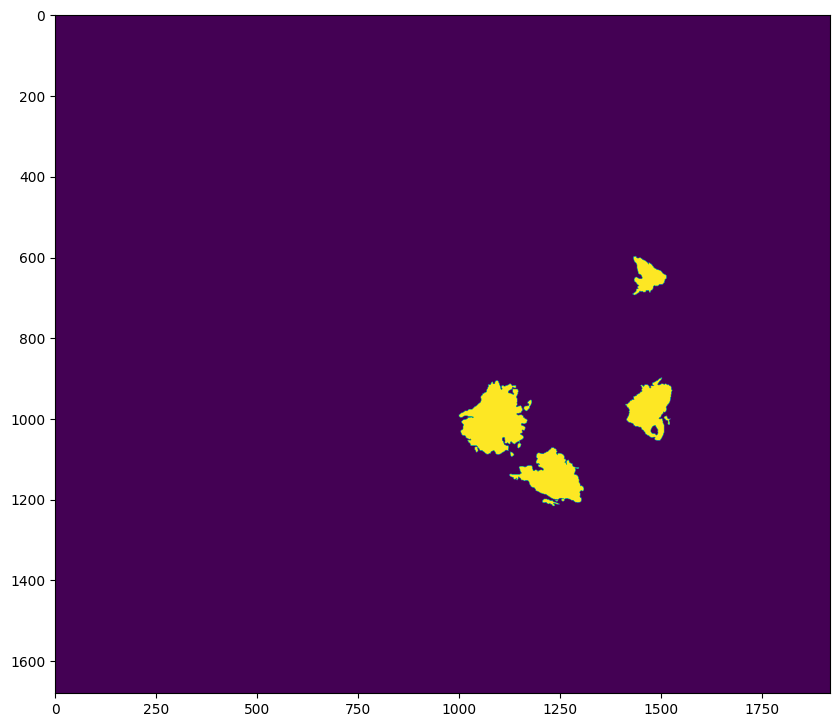

In [10]:
# Example: read the entire mask at the same zoom level
mask_image = read_slide(tumor_mask, 
                        x=0, 
                        y=0, 
                        level=5, 
                        width=slide.level_dimensions[5][0], 
                        height=slide.level_dimensions[5][1])

# Note: the program provided by the dataset authors generates a mask with R,G,B channels.
# The mask info we need is in the first channel only.
# If you skip this step, the mask will be displayed as all black.
mask_image = mask_image[:,:,0]

plt.figure(figsize=(10,10), dpi=100)
plt.imshow(mask_image)

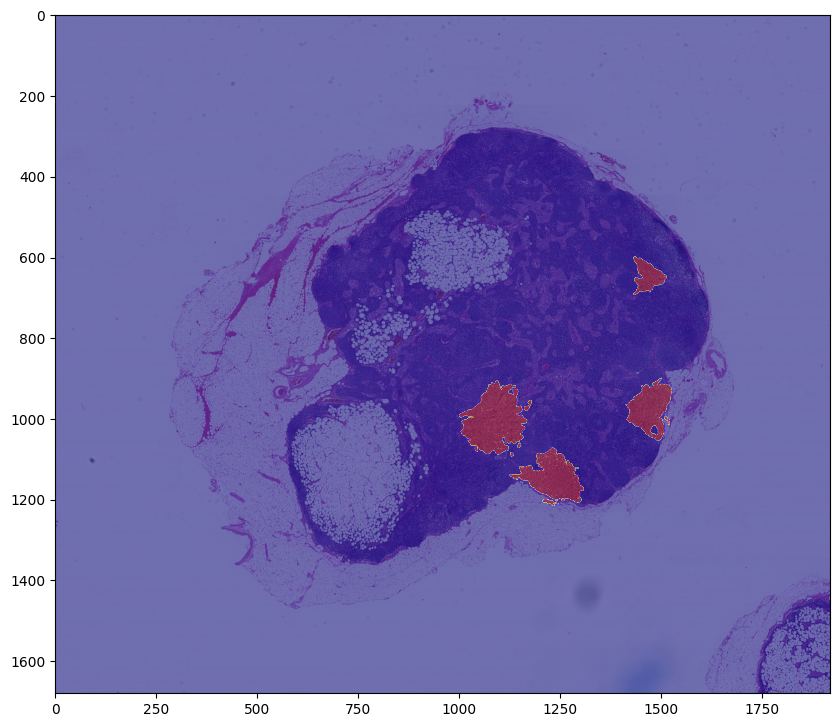

In [11]:
# Overlay them. The idea is that the mask shows the region of the slide that
# contain cancerous cells.
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(slide_image)
plt.imshow(mask_image, cmap='jet', alpha=0.5) # Red regions contains cancer.

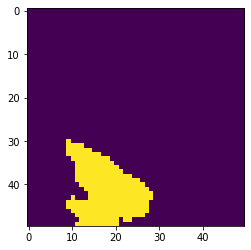

In [12]:
# Example: extract a region from the L7 downsampled image
# Notice we're multiplying the x,y coordinates by the downsample factor.
# This math can be tricky to get right, debug carefully.
# Here, we're "aiming" for the top right blob in the image above.
region = read_slide(tumor_mask, x=350 * 128, y=120 * 128, level=7, width=50, height=50)[:,:,0]
plt.imshow(region)

905504 tissue_pixels pixels (32.1 percent of the image)


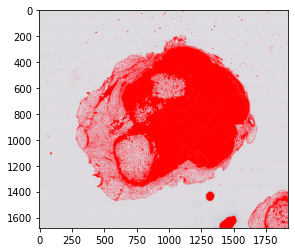

In [13]:
# As mentioned in class, we can improve efficiency by ignoring non-tissue areas 
# of the slide. We'll find these by looking for all gray regions.
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return list(zip(indices[0], indices[1]))

# my addition: also ignore black regions 
def find_tissue_pixels_no_black(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where((im_gray <= intensity) & (im_gray > 0))
    
    return list(zip(indices[0], indices[1]))

tissue_pixels = find_tissue_pixels_no_black(slide_image)
percent_tissue = len(tissue_pixels) / float(slide_image.shape[0] * slide_image.shape[0]) * 100
print ("%d tissue_pixels pixels (%.1f percent of the image)" % (len(tissue_pixels), percent_tissue)) 

def apply_mask(im, mask, color=(255,0,0)):
    masked = np.copy(im)
    for x,y in mask: masked[x][y] = color
    return masked

tissue_regions = apply_mask(slide_image, tissue_pixels)
plt.imshow(tissue_regions)

# My Code Below

In [14]:
#############################################################
# My code starts here 
#############################################################


from mpl_toolkits.axes_grid1 import ImageGrid

SUB_SIZE  = (224,224,3)


def split_image_regions(s, lvl=7, mask=False):
  '''
  input a slide object and load it into a set of SUB_SIZE sized images
  '''
  grid_size = (s.level_dimensions[lvl][0]//SUB_SIZE[0] , s.level_dimensions[lvl][1]//SUB_SIZE[1])

  regions=[]
  for row in range(grid_size[1]+1):
    for col in range(grid_size[0]+1):
      region = read_slide(s,
                          x=col * SUB_SIZE[0] * 2**lvl,
                          y=row * SUB_SIZE[1] * 2**lvl,
                          level=lvl, width=SUB_SIZE[0], height=SUB_SIZE[1])#[:,:,0]
      if mask:
        regions.append(tf.reshape(region[:,:,0],(SUB_SIZE[0],SUB_SIZE[1],1)))
      else:
        regions.append(region)
  
  if mask:
    out = ( tf.convert_to_tensor(regions) ) 
  else:
    out = ( tf.convert_to_tensor(regions, dtype=tf.float32) ) /255
  return out



def show_image_regions(regions, grid_size, mask=False):
  '''
  display a segmented image
  '''
  fig = plt.figure(figsize=(10., 10.))
  imgrid = ImageGrid(fig, 111,  # similar to subplot(111)
                  nrows_ncols=(grid_size[1]+1, grid_size[0]+1), 
                  axes_pad=0.05,  # pad between axes in inch.
                  )
  for ax, im in zip(imgrid, regions):
      if mask:
        ax.imshow(im[:,:,0])
      else:
        ax.imshow(im)
  plt.show()

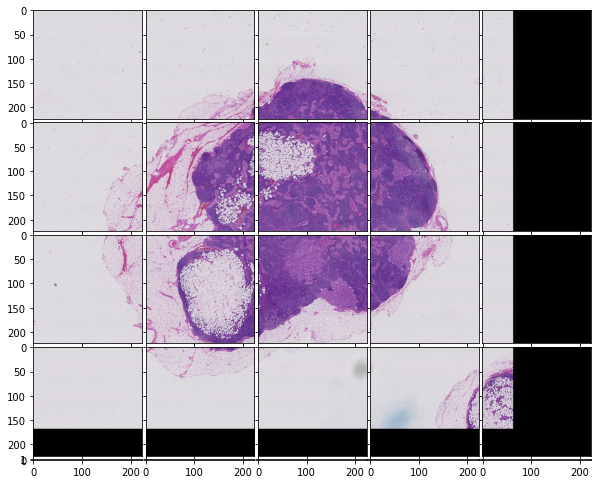

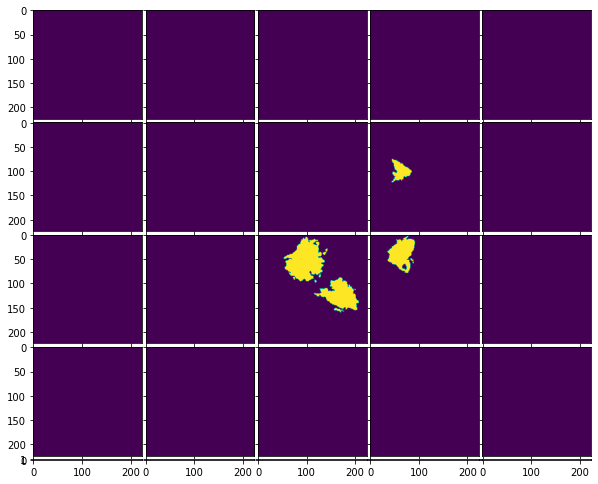

In [15]:
lvl = 6
regions = split_image_regions(slide, lvl=lvl)
show_image_regions(regions, (slide.level_dimensions[lvl][0]//SUB_SIZE[0], slide.level_dimensions[lvl][0]//SUB_SIZE[1]))
mask_regions = split_image_regions(tumor_mask, lvl=lvl, mask=True)
show_image_regions(mask_regions,
                   (slide.level_dimensions[lvl][0]//SUB_SIZE[0], slide.level_dimensions[lvl][0]//SUB_SIZE[1]),
                   mask=True)

In [16]:
class_labels = []#[tf.reduce_sum(m) for m in mask_regions]
for m in mask_regions:
  if tf.reduce_sum(m) > 0 :
    class_labels.append(1.0)
  else:
    class_labels.append(0.0)

#testy = [class_labels[8], class_labels[12], class_labels[13], class_labels[7], class_labels[11], class_labels[6]]
#testx = [ regions[8] , regions[12] , regions[13] , regions[7] , regions[11], regions[6] ]
class_labels = np.array(class_labels)

10
Epoch 1/25
1/1 [==============================] - 5s 5s/step - loss: 0.6661 - accuracy: 0.7000
Epoch 2/25
1/1 [==============================] - 0s 18ms/step - loss: 0.6149 - accuracy: 0.8500
Epoch 3/25
1/1 [==============================] - 0s 17ms/step - loss: 0.5658 - accuracy: 0.8500
Epoch 4/25
1/1 [==============================] - 0s 15ms/step - loss: 0.5298 - accuracy: 0.8500
Epoch 5/25
1/1 [==============================] - 0s 17ms/step - loss: 0.5224 - accuracy: 0.8500
Epoch 6/25
1/1 [==============================] - 0s 16ms/step - loss: 0.4939 - accuracy: 0.8500
Epoch 7/25
1/1 [==============================] - 0s 17ms/step - loss: 0.4804 - accuracy: 0.8500
Epoch 8/25
1/1 [==============================] - 0s 17ms/step - loss: 0.4655 - accuracy: 0.8500
Epoch 9/25
1/1 [==============================] - 0s 16ms/step - loss: 0.4685 - accuracy: 0.8500
Epoch 10/25
1/1 [==============================] - 0s 18ms/step - loss: 0.4722 - accuracy: 0.8500
Epoch 11/25
1/1 [===========

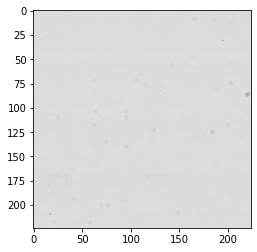

ground_truth :  0.0 ---  cancer confidence prediction :  0.15222044



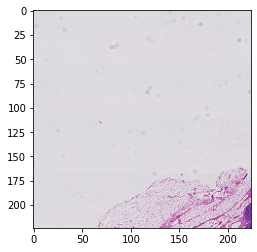

ground_truth :  0.0 ---  cancer confidence prediction :  0.14333536



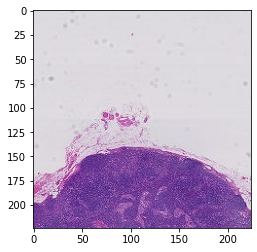

ground_truth :  0.0 ---  cancer confidence prediction :  0.14829768



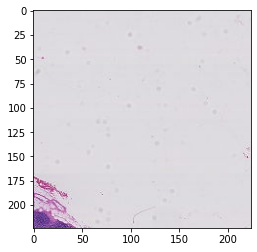

ground_truth :  0.0 ---  cancer confidence prediction :  0.22922018



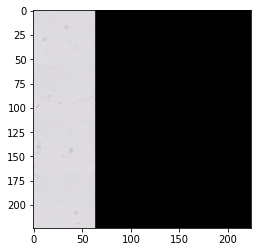

ground_truth :  0.0 ---  cancer confidence prediction :  0.14808175



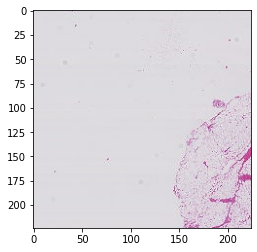

ground_truth :  0.0 ---  cancer confidence prediction :  0.14658046



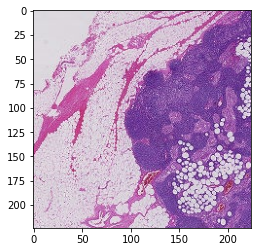

ground_truth :  0.0 ---  cancer confidence prediction :  0.16219294



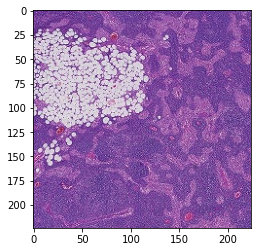

ground_truth :  1.0 ---  cancer confidence prediction :  0.23119788



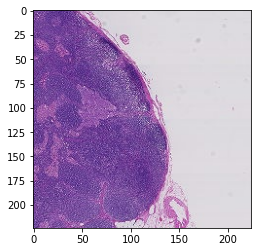

ground_truth :  0.0 ---  cancer confidence prediction :  0.22983555



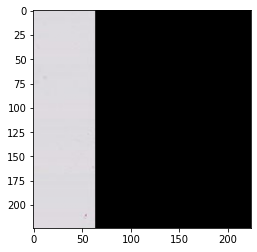

ground_truth :  0.0 ---  cancer confidence prediction :  0.14777908



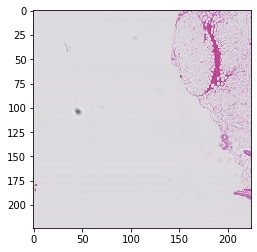

ground_truth :  0.0 ---  cancer confidence prediction :  0.12828766



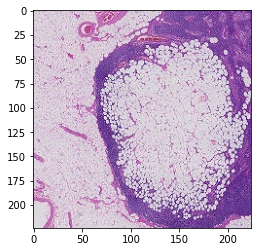

ground_truth :  1.0 ---  cancer confidence prediction :  0.2545106



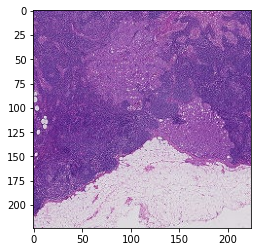

ground_truth :  1.0 ---  cancer confidence prediction :  0.19146559



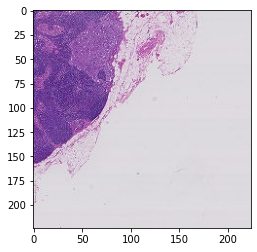

ground_truth :  0.0 ---  cancer confidence prediction :  0.23010795



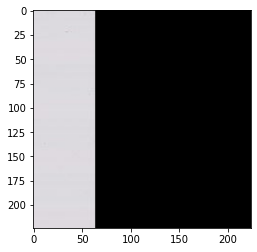

ground_truth :  0.0 ---  cancer confidence prediction :  0.13018432



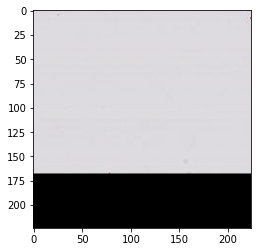

ground_truth :  0.0 ---  cancer confidence prediction :  0.1259961



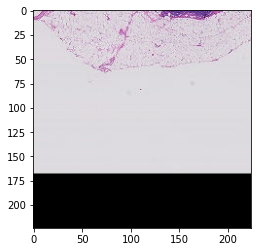

ground_truth :  0.0 ---  cancer confidence prediction :  0.13000289



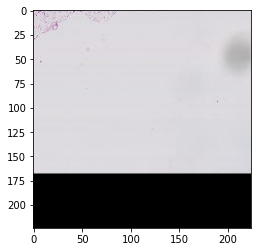

ground_truth :  0.0 ---  cancer confidence prediction :  0.13114695



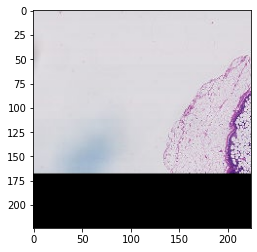

ground_truth :  0.0 ---  cancer confidence prediction :  0.23121195



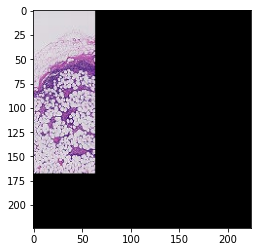

In [17]:
#############################################################
# Show that a CNN can memorize one high level slide 
#############################################################

test_model = tf.keras.models.Sequential()
test_model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=SUB_SIZE))
test_model.add(tf.keras.layers.MaxPooling2D((2, 2)))
test_model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
test_model.add(tf.keras.layers.MaxPooling2D((2, 2)))
test_model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
test_model.add(tf.keras.layers.Flatten())
test_model.add(tf.keras.layers.Dense(64, activation='relu'))
test_model.add(tf.keras.layers.Dropout(0.2))
test_model.add(tf.keras.layers.Dense(1, activation='sigmoid'))


print(len(test_model.trainable_variables))
base_learning_rate = 1e-5
test_model.compile(optimizer=tf.keras.optimizers.Adam(lr=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
              metrics=['accuracy'])

history = test_model.fit(x=regions, y=class_labels, epochs = 25)


p = test_model(regions , training=False)
for i in range(len(regions)):
  print('ground_truth : ', class_labels[i], '---', ' cancer confidence prediction : ', p[i].numpy()[0])
  print()
  plt.imshow(regions[i])
  plt.show()

# Download Necessary Files

In [18]:
#############################################################
# Get full data from cloud bucket
#############################################################


def download_if_missing(url, target, extract=True):
  if os.path.exists(target):
    return target
  return tf.keras.utils.get_file(target, origin=url, extract=extract)


ROOT = "/content/" 
BUCKET = 'https://storage.googleapis.com/ipj2103coms4995project2/'



TIF_FILES = ['tumor_001.tif', 'tumor_002.tif', 'tumor_005.tif', 'tumor_012.tif','tumor_016.tif',
            'tumor_031.tif', 'tumor_057.tif', 'tumor_059.tif', 'tumor_064.tif', 'tumor_075.tif',
            'tumor_084.tif', 'tumor_094.tif', 'tumor_078.tif', 'tumor_096.tif', 'tumor_110.tif', 
            'tumor_019.tif', 'tumor_035.tif']

TEST_FILES = ['tumor_101.tif',   'tumor_091.tif' , 'tumor_023.tif']



def download_tif_files(file_list=TIF_FILES):
  for filename in file_list:
    maskfilename = filename.split('.')[0]+'_mask.tif'
    slide_url = BUCKET + filename
    mask_url = BUCKET + maskfilename
    slide_file = os.path.join(ROOT, filename)
    mask_file = os.path.join(ROOT, maskfilename)
    download_if_missing(slide_url, slide_file, extract=False)
    download_if_missing(mask_url, mask_file, extract=False)


#download_tif_files()
download_tif_files(file_list=TEST_FILES)



In [20]:
# moved to saving sub image data sets as zip files in my cloud bucket
# this was much faster
download_if_missing(BUCKET + 'lvl1.zip', '/content/lvl1.zip')
download_if_missing(BUCKET + 'lvl2.zip', '/content/lvl2.zip')
download_if_missing(BUCKET + 'lvl3.zip', '/content/lvl3.zip')


'/content/lvl3.zip'

In [21]:
!unzip lvl1.zip
!unzip lvl2.zip
!unzip lvl3.zip

Streaming output truncated to the last 5000 lines.
  inflating: content/lvl2/negative/sn_2_16_3098.png  
  inflating: content/lvl2/negative/sn_2_15_2939.png  
  inflating: content/lvl2/negative/sn_2_11_3067.png  
  inflating: content/lvl2/negative/sn_2_0_3034.png  
  inflating: content/lvl2/negative/sn_2_3_3102.png  
  inflating: content/lvl2/negative/sn_2_16_3064.png  
  inflating: content/lvl2/negative/sn_2_10_2973.png  
  inflating: content/lvl2/negative/sn_2_15_3065.png  
  inflating: content/lvl2/negative/sn_2_10_2960.png  
  inflating: content/lvl2/negative/sn_2_5_2980.png  
  inflating: content/lvl2/negative/sn_2_8_2994.png  
  inflating: content/lvl2/negative/sn_2_0_2991.png  
  inflating: content/lvl2/negative/sn_2_1_2993.png  
  inflating: content/lvl2/negative/sn_2_7_3078.png  
  inflating: content/lvl2/negative/sn_2_4_2959.png  
  inflating: content/lvl2/negative/sn_2_15_3087.png  
  inflating: content/lvl2/negative/sn_2_12_3027.png  
  inflating: content/lvl2/negative/sn_2

In [22]:
#############################################################
# Visualize slide images 
#############################################################


LEVELS = [3,2,1]
SUB_SIZE  = (299,299,3)

def display_all_level_images(all_levels=False):
  for filename in TIF_FILES: # now on the local 
    for lvl in LEVELS:
      mask_s = open_slide(filename.split('.')[0]+'_mask.tif')
      slide_s = open_slide(filename)
      mask_img = read_slide(mask_s, 
                              x=0, 
                              y=0, 
                              level=lvl, 
                              width=slide_s.level_dimensions[lvl][0], 
                              height=slide_s.level_dimensions[lvl][1])
      slide_img = read_slide(slide_s, 
                              x=0, 
                              y=0, 
                              level=lvl, 
                              width=slide_s.level_dimensions[lvl][0], 
                              height=slide_s.level_dimensions[lvl][1])

      mask_img = mask_img[:,:,0]

      fig, (ax1, ax2) = plt.subplots(1, 2)
      fig.suptitle(filename.split('.')[0] + ' slide and mask images at zoom ' + str(lvl))
      ax1.imshow(slide_img)
      ax2.imshow(mask_img)
      plt.show()

      if not all_levels: break

#display_all_level_images()

# Create Positive and Negative Split of Slide Sub Images

In [1]:
#############################################################
# Save sub images at desired level from each slides
#############################################################


def clear_dir(dirr):
  '''
  util; throw away every file in a directory
  '''
  if not os.path.exists(dirr):
    return
  for f in os.listdir(dirr):
    if os.path.exists(dirr + f):
      os.remove(dirr + f )


def open_all_slides(file_list):
  '''
  returns a np array of all opened slide objects and another np array corresponding to the mask slides 
  '''

  slide_list = []
  mask_list = []
  for filename in file_list: # now on the local 
      mask_list.append(open_slide(filename.split('.')[0]+'_mask.tif'))
      slide_list.append(open_slide(filename))

  return np.array(slide_list), np.array(mask_list)



def save_simg_to_local(s_img, dir, name):
  '''
  wrapper on plt.imsave for convinience
  '''
  #print('saving simg ... ', dir, name)
  #im = Image.fromarray(s_img, 'RGB')
  #np.save(os.path.join(dir, name), im ) 
  plt.imsave(os.path.join(dir, str(name+'.png')), s_img, format='png')


def open_and_save_sub_images(name_add='', file_list=TIF_FILES, null_factor=0):
  '''
  save the sub images from the tif files in their own zoom level split for positive and negative 
  saved as png with plt.imsave 
  '''

  slides, masks = open_all_slides(file_list)
  print(SUB_SIZE)
  assert slides.shape[0] == masks.shape[0]
  for lvl in LEVELS:
    lvl_folder = os.path.join(ROOT, 'lvl'+str(lvl)+name_add)
    if not os.path.exists(lvl_folder):
      os.mkdir(lvl_folder)
      os.mkdir(os.path.join(lvl_folder, 'positive'))
      os.mkdir(os.path.join(lvl_folder, 'negative'))

    cancer_cnt = 0
    normal_cnt = 0 
    

    # add all the caner sub images that exist no matter what the flesh content is 
    for idx in range(slides.shape[0]):
      s = slides[idx]
      m = masks[idx]
      grid_size = (s.level_dimensions[lvl][0]//SUB_SIZE[0] , s.level_dimensions[lvl][1]//SUB_SIZE[1])
      print('still saving ', lvl, 'positives')

      # look through sub regions 
      for row in range(grid_size[1]+1):
        for col in range(grid_size[0]+1):
          s_region = read_slide(s,
                  x=col * SUB_SIZE[0] * 2**lvl,
                  y=row * SUB_SIZE[1] * 2**lvl,
                  level=lvl, width=SUB_SIZE[0], height=SUB_SIZE[1])
          m_region = read_slide(m,
                  x=col * SUB_SIZE[0] * 2**lvl,
                  y=row * SUB_SIZE[1] * 2**lvl,
                  level=lvl, width=SUB_SIZE[0], height=SUB_SIZE[1])[:,:,0]
          #m_region = m_region.reshape((m_region.shape[0],m_region.shape[1],1))
          
          #if sum of m_region is not zero then save it   
          if np.sum(m_region) != 0:
            cancer_cnt+=1
            save_simg_to_local(s_region, os.path.join(lvl_folder,'positive'), 'sp_'+str(lvl)+'_'+str(idx)+'_'+str(cancer_cnt)+name_add)

    


    # try to add just as many non cancer evenly sampled from each slide
    used_cells = []
    examples_per_slide = cancer_cnt // slides.shape[0] * null_factor
    print('\t target number of examples : ', cancer_cnt, examples_per_slide * slides.shape[0])
    for idx in range(slides.shape[0]):
      s = slides[idx]
      m = masks[idx]
      grid_size = (s.level_dimensions[lvl][0]//SUB_SIZE[0] , s.level_dimensions[lvl][1]//SUB_SIZE[1])
      print('still saving ', lvl, 'negatives')
      print(normal_cnt)

      cnt = 0 
      #print(len(used_cells), grid_size, examples_per_slide)
      used_cells = []
      while len(used_cells) < ((grid_size[1]+1) * (grid_size[0]+1)) and cnt < examples_per_slide:
        row = random.randint(0,grid_size[1])
        col = random.randint(0,grid_size[0])
        if [row, col] in used_cells:
          continue

        used_cells.append([row,col])
        s_region = read_slide(s,
                x=col * SUB_SIZE[0] * 2**lvl,
                y=row * SUB_SIZE[1] * 2**lvl,
                level=lvl, width=SUB_SIZE[0], height=SUB_SIZE[1])
        m_region = read_slide(m,
                x=col * SUB_SIZE[0] * 2**lvl,
                y=row * SUB_SIZE[1] * 2**lvl,
                level=lvl, width=SUB_SIZE[0], height=SUB_SIZE[1])[:,:,0]

        if np.sum(m_region) == 0 and len(find_tissue_pixels_no_black(s_region)) / float(s_region.shape[0] * s_region.shape[0]) > 0.25:
            cnt+=1
            normal_cnt += 1
            save_simg_to_local(s_region, os.path.join(lvl_folder,'negative'), 'sn_'+str(lvl)+'_'+str(idx)+'_'+str(cancer_cnt + cnt)+name_add)
      



  print('final class split : ', cancer_cnt, normal_cnt)


#clear_dir('./lvl4/positive/')
#clear_dir('./lvl4/negative/')
#clear_dir('./lvl3/positive/')
#clear_dir('./lvl3/negative/')
#clear_dir('./lvl2/positive/')
#clear_dir('./lvl2/negative/')
#clear_dir('./lvl1/positive/')
#clear_dir('./lvl1/negative/')


#RATIO_NORMAL_TO_CANCER = 1
#print('saving sub images per level ... this may take a few min for high level slides ... ')

# !!!
# uncomment this to actually save the sub images 
# open_and_save_sub_images(null_factor=RATIO_NORMAL_TO_CANCER)
# don't have to run this if using the lvl zip files
# !!! 

#print('done!')

# possible to remove costly tif files now 

#print(len(os.listdir('./lvl2/positive')))

NameError: ignored

In [24]:
#!zip -r /checkpoints.zip /checkpoints/
#!zip -r /content/lvl1.zip /content/lvl1

In [25]:
#!zip -r /content/lvl2.zip /content/lvl2
#!zip -r /content/lvl3.zip /content/lvl3

In [26]:
#os.path.getsize('/content/lvl1.zip')/1e9

In [28]:
#from google.colab import drive
#drive.mount('/content/gdrive',force_remount=True)

In [29]:
#!cp /content/lvl1.zip '/content/gdrive/My Drive/'
#!ls -lt '/content/gdrive/My Drive/' 

In [30]:
#!cp /content/lvl2.zip '/content/gdrive/My Drive/'
#!ls -lt '/content/gdrive/My Drive/' 
#!cp /content/lvl3.zip '/content/gdrive/My Drive/'
#!ls -lt '/content/gdrive/My Drive/' 

In [31]:
#!zip -r /content/checkpoints2.zip /checkpoints2
#!cp /content/checkpoints2.zip '/content/gdrive/My Drive/'
#!ls -lt '/content/gdrive/My Drive/' 
#!zip -r /content/checkpoints3.zip /checkpoints3
#!cp /content/checkpoints3.zip '/content/gdrive/My Drive/'
#!ls -lt '/content/gdrive/My Drive/' 

# Sanity Check Created Datasets

In [33]:

BATCH_SIZE = 1

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    #"./lvl2/",
    "./content/lvl2/",
    validation_split=0.2,
    subset="training",
    seed=1,
    image_size=(SUB_SIZE[0], SUB_SIZE[1]),
    batch_size=BATCH_SIZE,
    shuffle=False
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    #"./lvl2/",
    "./content/lvl2/",
    validation_split=0.2,
    subset="validation",
    seed=1,
    image_size=(SUB_SIZE[0], SUB_SIZE[1]),
    batch_size=BATCH_SIZE,
    shuffle=False
)

print()


Found 5856 files belonging to 2 classes.
Using 4685 files for training.
Found 5856 files belonging to 2 classes.
Using 1171 files for validation.



0


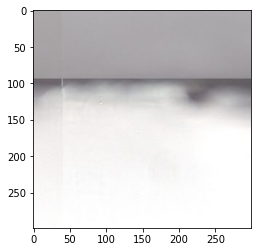

0


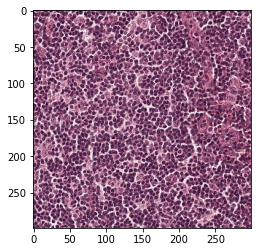

0


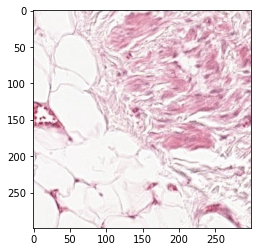

0


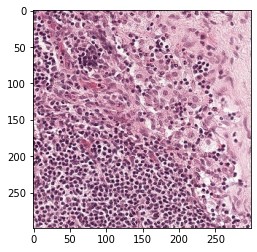

0


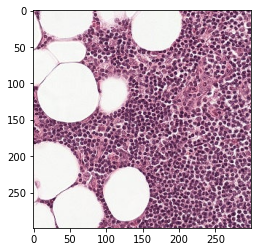

0


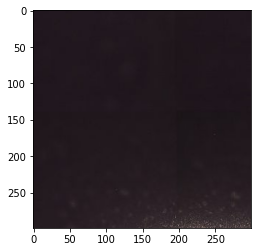

0


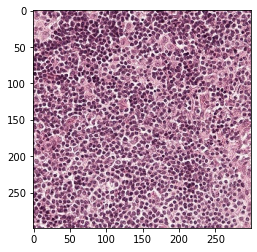

0


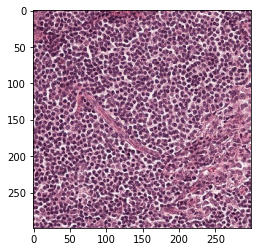

0


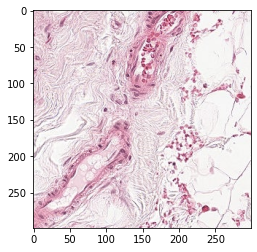

0


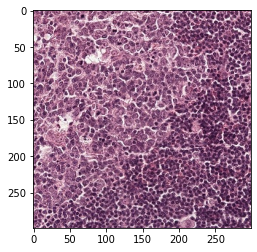

0


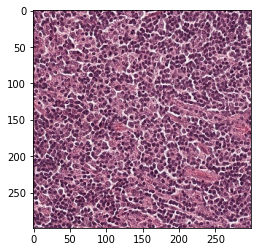

0


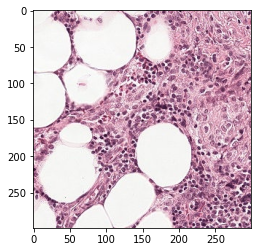

0


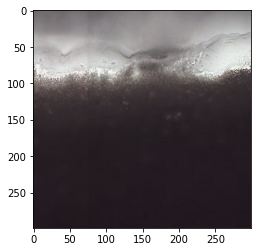

0


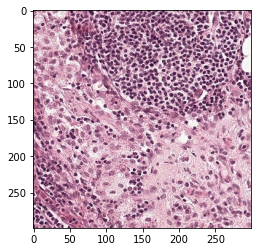

0


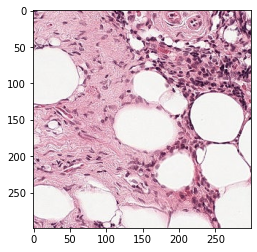

0


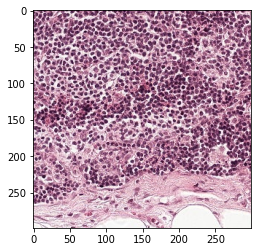

0


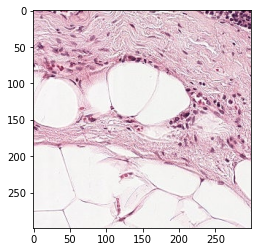

0


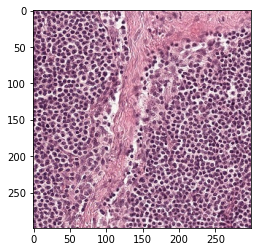

0


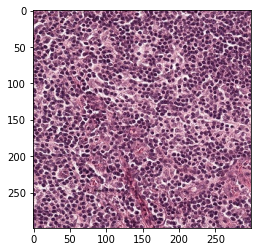

0


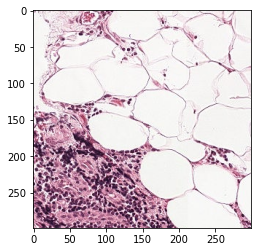

In [34]:
for im in train_ds.take(20):
  print(im[1].numpy()[0])
  plt.imshow(im[0][0]/255)
  plt.show()


In [35]:
def check_imbalance(train_ds, val_ds): 
  num_cancer = 0
  num_normal = 0 
  for ex in train_ds:
    if ex[1].numpy()[0] == 1:
      num_cancer += 1
    elif ex[1].numpy()[0] == 0:
      num_normal += 1
    else:
      raise ValueError

  print('\t train class imbalance : ')
  print('\t cancer -- ', num_cancer)
  print('\t normal -- ', num_normal)

  num_cancer = 0
  num_normal = 0
  for ex in val_ds:
    if ex[1].numpy()[0] == 1:
      num_cancer += 1
    elif ex[1].numpy()[0] == 0:
      num_normal += 1
    else:
      raise ValueError

  print('\t val class imbalance : ')
  print('\t cancer -- ', num_cancer)
  print('\t normal -- ', num_normal)

check_imbalance(train_ds, val_ds)

# Data Augmentations

In [36]:
#############################################################
# Define augmentations  
#############################################################

class RandomSquareRotation(tf.keras.layers.Layer):
  def __init__(self):
    super(RandomSquareRotation, self).__init__()
  def call(self, input):
    factor = random.randint(0,3)
    return tf.image.rot90(input, k=factor)




class RandomBrightness(tf.keras.layers.Layer):
  def __init__(self):
    super(RandomBrightness, self).__init__()
  def call(self, input):
    #return tf.image.random_brightness(input, 64/255)
    return tf.image.random_brightness(input, 128/255)

class RandomSaturation(tf.keras.layers.Layer):
  def __init__(self):
    super(RandomSaturation, self).__init__()
  def call(self, input):
    #return tf.image.random_saturation(input, 0.25, 1.75)
    return tf.image.random_saturation(input, 0.15, 1.85)

class RandomHue(tf.keras.layers.Layer):
  def __init__(self):
    super(RandomHue, self).__init__()
  def call(self, input):
    #return tf.image.random_hue(input, 0.04)
    return tf.image.random_hue(input, 0.05)

class RandomContrast(tf.keras.layers.Layer):
  def __init__(self):
    super(RandomContrast, self).__init__()
  def call(self, input):
    #return tf.image.random_contrast(input, 0.25, 1.75)
    return tf.image.random_contrast(input, 0.15, 1.65)



RandRot = RandomSquareRotation()
RandBrit = RandomBrightness()
RandSat = RandomSaturation()
RandHue = RandomHue()
RandCont = RandomContrast()

BATCH_SIZE = 1
AUTOTUNE = tf.data.experimental.AUTOTUNE

# following augmentations used in the paper
DATA_AUG = tf.keras.Sequential([
  RandRot,
  tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
  RandRot,
  RandBrit,
  RandSat,
  RandHue,
  RandCont,
  tf.keras.layers.experimental.preprocessing.Rescaling(1./255)
])

RESCALE = tf.keras.Sequential([tf.keras.layers.experimental.preprocessing.Rescaling(1./255)])

def data_augmentation(image, label):
  aug = DATA_AUG(image)
  return aug, label

def just_rescale(image, label):
  rescaled = RESCALE(image)
  return rescaled, label

In [37]:
AUTOTUNE = tf.data.experimental.AUTOTUNE


train_ds = train_ds.map(data_augmentation)
train_ds.prefetch(buffer_size=AUTOTUNE)
train_ds.cache()

val_ds = val_ds.map(just_rescale)
val_ds.prefetch(buffer_size=AUTOTUNE)
val_ds.cache()



print()


0


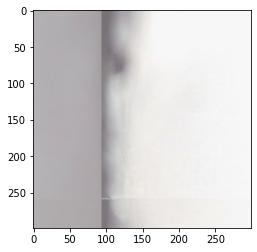

0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


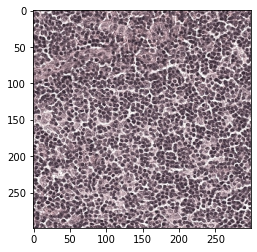

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


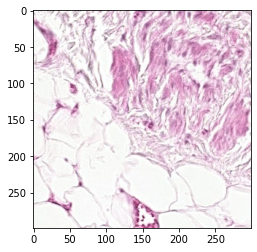

0


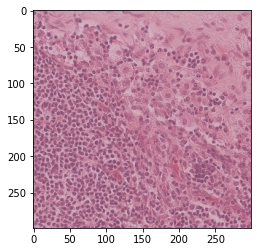

0


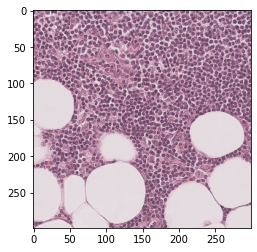

0


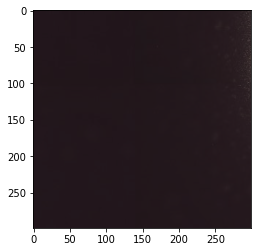

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


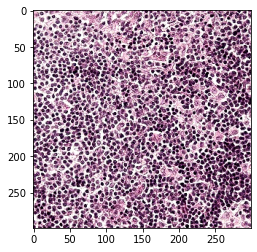

0


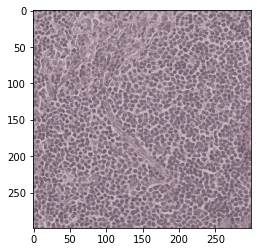

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


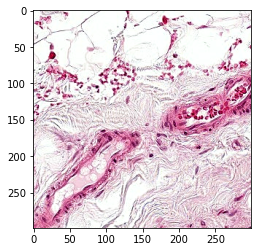

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


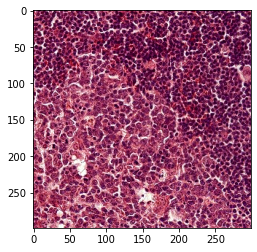

0


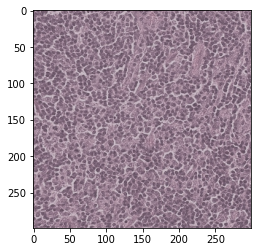

0


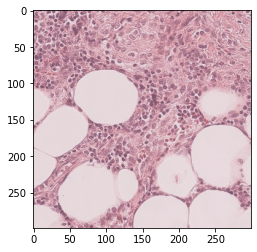

0


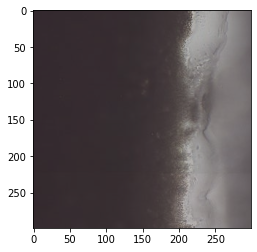

0


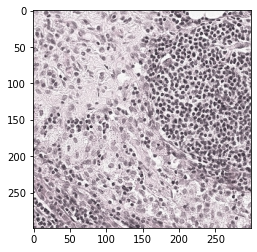

0


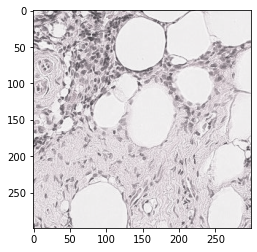

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


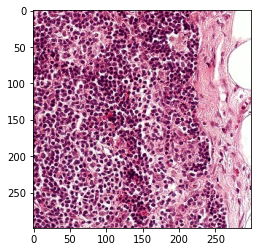

0


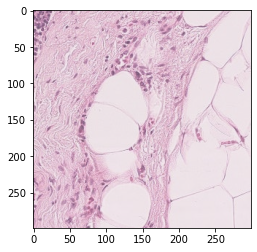

0


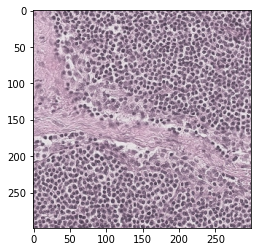

0


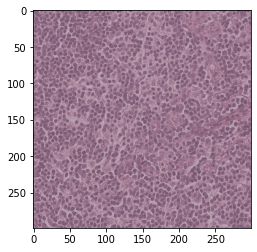

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0


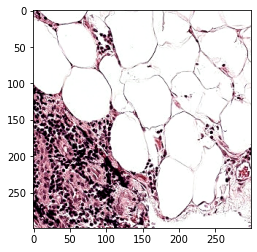


 @@@@@@@@@ 

1


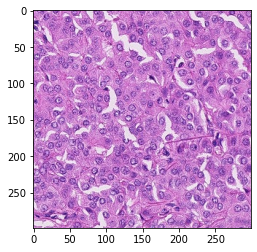

1


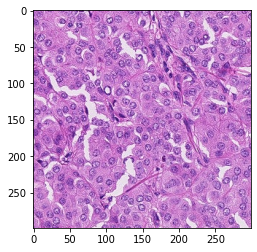

1


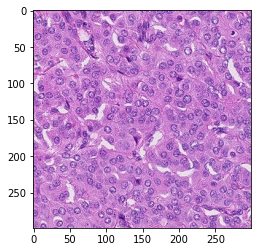

1


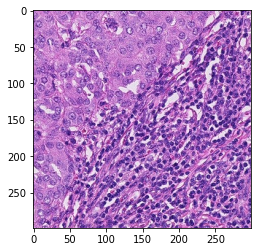

1


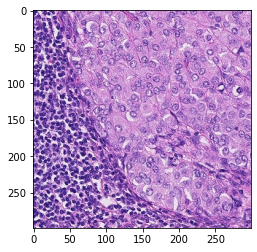

1


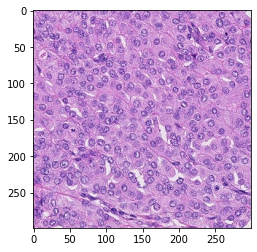

1


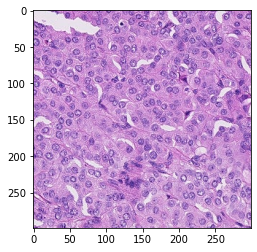

1


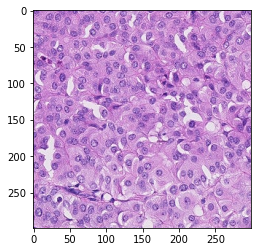

1


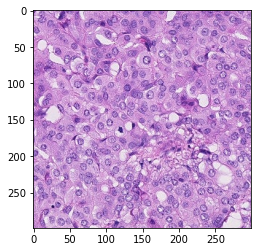

1


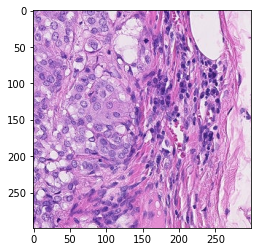

In [38]:
for im in train_ds.take(20):
  print(im[1].numpy()[0])
  plt.imshow(im[0][0])
  plt.show()

print('\n @@@@@@@@@ \n')

for im in val_ds.take(10):
  print(im[1].numpy()[0])
  plt.imshow(im[0][0])
  plt.show()

# Train Models at Each Zoom Level

In [ ]:
#############################################################
# Make CNN level models   
#############################################################


model3 = tf.keras.models.Sequential()
model3.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=SUB_SIZE))
model3.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=SUB_SIZE))
model3.add(tf.keras.layers.MaxPooling2D((2, 2)))
model3.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model3.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model3.add(tf.keras.layers.MaxPooling2D((2, 2)))
model3.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model3.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model3.add(tf.keras.layers.Flatten())
model3.add(tf.keras.layers.Dense(64, activation='relu'))
model3.add(tf.keras.layers.Dropout(0.2))
model3.add(tf.keras.layers.Dense(32, activation='relu'))
model3.add(tf.keras.layers.Dropout(0.2))
model3.add(tf.keras.layers.Dense(1, activation='sigmoid'))


model2 = tf.keras.models.Sequential()
model2.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=SUB_SIZE))
model2.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=SUB_SIZE))
model2.add(tf.keras.layers.MaxPooling2D((2, 2)))
model2.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model2.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model2.add(tf.keras.layers.MaxPooling2D((2, 2)))
model2.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model2.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model2.add(tf.keras.layers.Flatten())
model2.add(tf.keras.layers.Dense(64, activation='relu'))
model2.add(tf.keras.layers.Dropout(0.2))
model2.add(tf.keras.layers.Dense(32, activation='relu'))
model2.add(tf.keras.layers.Dropout(0.2))
model2.add(tf.keras.layers.Dense(1, activation='sigmoid'))


model1 = tf.keras.models.Sequential()
model1.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=SUB_SIZE))
model1.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=SUB_SIZE))
model1.add(tf.keras.layers.MaxPooling2D((2, 2)))
model1.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model1.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model1.add(tf.keras.layers.MaxPooling2D((2, 2)))
model1.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model1.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu'))
model1.add(tf.keras.layers.Flatten())
model1.add(tf.keras.layers.Dense(64, activation='relu'))
model1.add(tf.keras.layers.Dropout(0.2))
model1.add(tf.keras.layers.Dense(32, activation='relu'))
model1.add(tf.keras.layers.Dropout(0.2))
model1.add(tf.keras.layers.Dense(1, activation='sigmoid'))



In [41]:
#############################################################
# Main Training loop  
#############################################################

BATCH_SIZE = 16

datafolders = [] 
models = [model3, model2, model1]
learning_rates = [1e-4, 5e-5, 1e-5]
histories = []

for lvl in LEVELS: 
  #datafolders.append("./lvl"+str(lvl)+"/")
  datafolders.append("./content/lvl"+str(lvl)+"/")

for idx, df in enumerate(datafolders):

  if not os.path.exists('/checkpoints'+str(LEVELS[idx])+'/'): os.mkdir('/checkpoints'+str(LEVELS[idx])+'/')
  checkpoint_path = '/checkpoints'+str(LEVELS[idx])+'/cp-{epoch:04d}.ckpt'
  checkpoint_dir = os.path.dirname(checkpoint_path)
  cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                  save_weights_only=True,
                                                  verbose=1,
                                                  save_freq=100*BATCH_SIZE)


  train_ds = tf.keras.preprocessing.image_dataset_from_directory(
      df,
      validation_split=0.2,
      subset="training",
      seed=111,
      image_size=(SUB_SIZE[0], SUB_SIZE[1]),
      batch_size=BATCH_SIZE,
      shuffle=True
  )
  val_ds = tf.keras.preprocessing.image_dataset_from_directory(
      df,
      validation_split=0.2,
      subset="validation",
      seed=111,
      image_size=(SUB_SIZE[0], SUB_SIZE[1]),
      batch_size=BATCH_SIZE,
      shuffle=True
  )

  #check_imbalance(train_ds, val_ds)
  train_ds = train_ds.map(data_augmentation)
  train_ds.prefetch(buffer_size=AUTOTUNE)
  train_ds.cache()

  val_ds = val_ds.map(just_rescale)
  val_ds.prefetch(buffer_size=AUTOTUNE)
  val_ds.cache()

  models[idx].compile(optimizer=tf.keras.optimizers.Adam(lr=learning_rates[idx]),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
              metrics=['accuracy'])

  history = models[idx].fit(train_ds, epochs = 48, batch_size=BATCH_SIZE,  validation_data=val_ds, callbacks=[cp_callback])
  histories.append(history)

Found 1873 files belonging to 2 classes.
Using 1499 files for training.
Found 1873 files belonging to 2 classes.
Using 374 files for validation.
Epoch 1/48
94/94 [==============================] - 23s 231ms/step - loss: 0.6754 - accuracy: 0.5865 - val_loss: 0.6299 - val_accuracy: 0.6257
Epoch 2/48
94/94 [==============================] - 21s 219ms/step - loss: 0.6471 - accuracy: 0.6200 - val_loss: 0.6102 - val_accuracy: 0.7059
Epoch 3/48
94/94 [==============================] - 21s 219ms/step - loss: 0.6432 - accuracy: 0.6317 - val_loss: 0.5730 - val_accuracy: 0.7246
Epoch 4/48
94/94 [==============================] - 21s 216ms/step - loss: 0.6348 - accuracy: 0.6536 - val_loss: 0.5860 - val_accuracy: 0.7406
Epoch 5/48
94/94 [==============================] - 21s 213ms/step - loss: 0.6073 - accuracy: 0.6869 - val_loss: 0.5758 - val_accuracy: 0.7005
Epoch 6/48
94/94 [==============================] - 20s 212ms/step - loss: 0.5880 - accuracy: 0.6879 - val_loss: 0.5637 - val_accuracy: 0.74

In [42]:
#from google.colab import drive
#drive.mount('/content/gdrive',force_remount=True)

#!zip -r /content/checkpoints1.zip /checkpoints1
#!cp /content/checkpoints1.zip '/content/gdrive/My Drive/'

Mounted at /content/gdrive
  adding: checkpoints1/ (stored 0%)
  adding: checkpoints1/cp-0010.ckpt.data-00000-of-00001 (deflated 26%)
  adding: checkpoints1/cp-0034.ckpt.data-00000-of-00001 (deflated 24%)
  adding: checkpoints1/cp-0002.ckpt.data-00000-of-00001 (deflated 30%)
  adding: checkpoints1/cp-0039.ckpt.data-00000-of-00001 (deflated 24%)
  adding: checkpoints1/cp-0002.ckpt.index (deflated 72%)
  adding: checkpoints1/cp-0004.ckpt.index (deflated 72%)
  adding: checkpoints1/cp-0036.ckpt.data-00000-of-00001 (deflated 24%)
  adding: checkpoints1/cp-0030.ckpt.data-00000-of-00001 (deflated 24%)
  adding: checkpoints1/cp-0018.ckpt.data-00000-of-00001 (deflated 25%)
  adding: checkpoints1/cp-0031.ckpt.index (deflated 72%)
  adding: checkpoints1/cp-0047.ckpt.index (deflated 72%)
  adding: checkpoints1/checkpoint (deflated 40%)
  adding: checkpoints1/cp-0009.ckpt.index (deflated 72%)
  adding: checkpoints1/cp-0036.ckpt.index (deflated 72%)
  adding: checkpoints1/cp-0034.ckpt.index (deflat

# Visualize Results

@@@@@@@@@ level  3 @@@@@@@@@


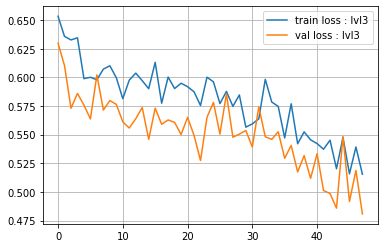

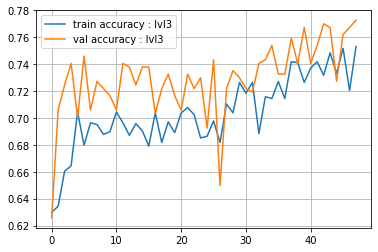

@@@@@@@@@ level  2 @@@@@@@@@


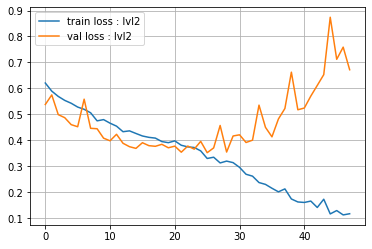

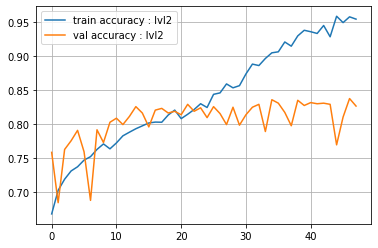

@@@@@@@@@ level  1 @@@@@@@@@


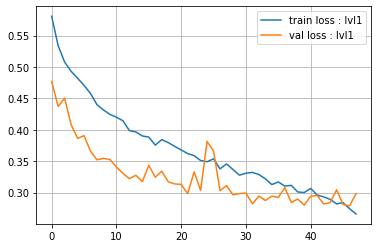

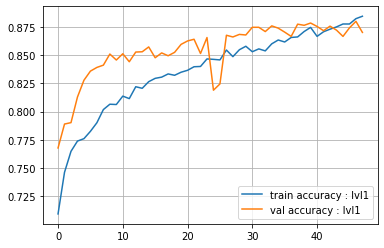

In [43]:
#############################################################
# Visualizing training and validation performance for each level model 
#############################################################

for idx, h in enumerate(histories):
  print('@@@@@@@@@ level ', LEVELS[idx] , '@@@@@@@@@')
  plt.plot(h.history['loss'], label='train loss : lvl' + str(LEVELS[idx]))
  plt.plot(h.history['val_loss'], label='val loss : lvl' + str(LEVELS[idx]))
  plt.legend()
  plt.grid()
  plt.show()
  plt.plot(h.history['accuracy'], label='train accuracy : lvl' + str(LEVELS[idx]))
  plt.plot(h.history['val_accuracy'], label='val accuracy : lvl' + str(LEVELS[idx]))
  plt.legend()
  plt.grid()
  plt.show()



In [ ]:
#############################################################
# Visualize confidence on many validation examples 
#############################################################

for ex in val_ds.take(100):
  print('ground truth : ', ex[1].numpy()[0])
  print('cancer confidence : ', models[-1](ex[0]).numpy()[0][0])
  plt.imshow(ex[0][0])

  plt.show()

print()

In [44]:
#############################################################
# Visualize heat maps on complete and unseen test slides
#############################################################

CONF_THRESH = 0.8

def slide_heat_map(slide, mask, levels, models=None, conf_thresh=CONF_THRESH):
  assert levels[0] == max(levels)

  grid_size = (slide.level_dimensions[levels[0]][0]//SUB_SIZE[0] , slide.level_dimensions[levels[0]][1]//SUB_SIZE[1])
  test_full_output = np.zeros((SUB_SIZE[0]*(grid_size[1]+1), SUB_SIZE[1]*(grid_size[0]+1)))
  full_output = np.zeros((SUB_SIZE[0]*(grid_size[1]+1), SUB_SIZE[1]*(grid_size[0]+1)))


  for idx, lvl in enumerate(levels):
    print('@@@@@@@@', lvl, '@@@@@@@@@@@')
    this_grid_size = (slide.level_dimensions[lvl][0]//SUB_SIZE[0] , slide.level_dimensions[lvl][1]//SUB_SIZE[1])
    for row in range(this_grid_size[1]+1):
      for col in range(this_grid_size[0]+1):


        down_sample_factor = 2**(levels[0]-lvl)
        s_region = read_slide(slide,
                x=col * SUB_SIZE[0] * 2**lvl,
                y=row * SUB_SIZE[1] * 2**lvl,
                level=lvl, width=SUB_SIZE[0], height=SUB_SIZE[1])
        m_region = read_slide(mask,
                x=col * SUB_SIZE[0] * 2**lvl,
                y=row * SUB_SIZE[1] * 2**lvl,
                level=lvl, width=SUB_SIZE[0], height=SUB_SIZE[1])
        




        if models is None:
          full_output[row*(SUB_SIZE[0])//down_sample_factor:(row+1)*(SUB_SIZE[0])//down_sample_factor, col*(SUB_SIZE[1])//down_sample_factor:(col+1)*(SUB_SIZE[1])//down_sample_factor] += m_region.max()/len(levels)
          test_full_output[row*(SUB_SIZE[0])//down_sample_factor:(row+1)*(SUB_SIZE[0])//down_sample_factor, col*(SUB_SIZE[1])//down_sample_factor:(col+1)*(SUB_SIZE[1])//down_sample_factor] += m_region.max()/len(levels)
        else:
          if models[idx] is None:
            full_output[row*(SUB_SIZE[0])//down_sample_factor:(row+1)*(SUB_SIZE[0])//down_sample_factor, col*(SUB_SIZE[1])//down_sample_factor:(col+1)*(SUB_SIZE[1])//down_sample_factor] += 0
            test_full_output[row*(SUB_SIZE[0])//down_sample_factor:(row+1)*(SUB_SIZE[0])//down_sample_factor, col*(SUB_SIZE[1])//down_sample_factor:(col+1)*(SUB_SIZE[1])//down_sample_factor] += 0
          else:
            s_region = s_region/255.
            s_ = np.reshape(s_region, (1, s_region.shape[0], s_region.shape[1], s_region.shape[2]))
            cancer_confidence =  models[idx](s_, training=False).numpy()[0][0]
                        
            full_output[row*(SUB_SIZE[0])//down_sample_factor:(row+1)*(SUB_SIZE[0])//down_sample_factor, col*(SUB_SIZE[1])//down_sample_factor:(col+1)*(SUB_SIZE[1])//down_sample_factor] += cancer_confidence/(len(levels)-1)
            test_full_output[row*(SUB_SIZE[0])//down_sample_factor:(row+1)*(SUB_SIZE[0])//down_sample_factor, col*(SUB_SIZE[1])//down_sample_factor:(col+1)*(SUB_SIZE[1])//down_sample_factor] += m_region.max()/len(levels)

            '''
            if len(find_tissue_pixels_no_black(s_region)) / float(s_region.shape[0] * s_region.shape[0]) > 0.25:
              print( 'ground truth : ',  m_region.max() )
              print( 'cancer confidence : ',  cancer_confidence )
              plt.imshow(s_region)
              plt.show()
            '''


    


  fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5)
  fig.set_size_inches(15,20)

  slide_image = read_slide(slide, 
                        x=0, 
                        y=0, 
                        level=levels[0], 
                        width=slide.level_dimensions[levels[0]][0], 
                        height=slide.level_dimensions[levels[0]][1])
  mask_image = read_slide(mask, 
                        x=0, 
                        y=0, 
                        level=levels[0], 
                        width=slide.level_dimensions[levels[0]][0], 
                        height=slide.level_dimensions[levels[0]][1])

  mask_image = mask_image[:,:,0]
  cropped_output = np.zeros(mask_image.shape)
  test_cropped_output = np.zeros(mask_image.shape)

  cropped_output = full_output[:cropped_output.shape[0], :cropped_output.shape[1]]
  print( 'max confidence : ' , cropped_output.max() )
  print( 'min confidence : ' , cropped_output.min() )
  test_cropped_output = test_full_output[:test_cropped_output.shape[0], :test_cropped_output.shape[1]]
  
  thresh_out = np.where(cropped_output >= conf_thresh, 1, 0)
  test_thresh_out = np.where(test_cropped_output >= test_cropped_output.max(), 1 , 0)

  print('\n')

  iou_h = tf.keras.metrics.MeanIoU(num_classes=2)
  precision_h = tf.keras.metrics.Precision()
  recall_h = tf.keras.metrics.Recall()
  iou_h.update_state(mask_image, thresh_out)
  precision_h.update_state(mask_image, thresh_out)
  recall_h.update_state(mask_image, thresh_out)
  print('high res iou : ' , iou_h.result().numpy())
  print('high res F1 : ', 2 * precision_h.result().numpy() * recall_h.result().numpy() / (precision_h.result().numpy() + recall_h.result().numpy() + 1e-10))
  print('high res precision : ' , precision_h.result().numpy())
  print('high res recall : ' , recall_h.result().numpy())

  print('\n @@@@@@@@@@@@@@  \n')

  iou_l = tf.keras.metrics.MeanIoU(num_classes=2)
  precision_l = tf.keras.metrics.Precision()
  recall_l = tf.keras.metrics.Recall()
  iou_l.update_state(test_thresh_out, thresh_out)
  precision_l.update_state(test_thresh_out, thresh_out)
  recall_l.update_state(test_thresh_out, thresh_out)
  print('low res iou : ' , iou_l.result().numpy())
  print('low res F1 : ', 2 * precision_l.result().numpy() * recall_l.result().numpy() / (precision_l.result().numpy() + recall_l.result().numpy() + 1e-10))
  print('low res precision : ' , precision_l.result().numpy())
  print('low res recall : ' , recall_l.result().numpy())
  
  ax1.imshow(slide_image)
  ax1.imshow(mask_image, cmap='jet', alpha=0.5)
  ax1.axis('off')
  ax1.set_title('high res ground truth mask')
  ax2.imshow(slide_image)
  ax2.imshow(test_thresh_out, cmap='jet', alpha=0.5)
  ax2.axis('off')
  ax2.set_title('low res ground truth mask')
  ax3.imshow(slide_image)
  ax3.imshow(thresh_out, cmap='jet', alpha=0.5)
  ax3.axis('off')
  ax3.set_title('thresholded prediction')
  ax4.imshow(slide_image)
  ax4.imshow(test_cropped_output, cmap='jet', alpha=0.5)
  ax4.axis('off')
  ax4.set_title('ground truth heat map')
  ax5.imshow(slide_image)
  ax5.imshow(cropped_output, cmap='jet', alpha=0.5)
  ax5.axis('off')
  ax5.set_title('prediction heat map')

  plt.show()
  print('\n')





In [46]:
model2.load_weights('/checkpoints2/cp-0022.ckpt')

   //////////////////////////   tau =  0.8    //////////////////////////   
@@@@@@@@ 7 @@@@@@@@@@@
@@@@@@@@ 3 @@@@@@@@@@@
@@@@@@@@ 2 @@@@@@@@@@@
@@@@@@@@ 1 @@@@@@@@@@@
max confidence :  0.9462055166562398
min confidence :  2.295617548225811e-05


high res iou :  0.7583511
high res F1 :  0.6915717837147041
high res precision :  0.7040987
high res recall :  0.6794828

 @@@@@@@@@@@@@@  

low res iou :  0.72549915
low res F1 :  0.6370946859347665
low res precision :  0.76465404
low res recall :  0.54600954


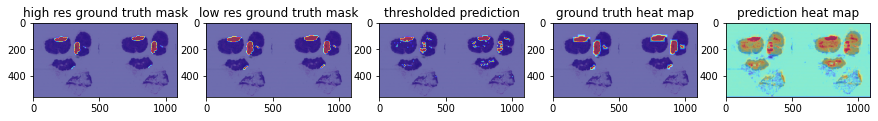

In [51]:
filename = TEST_FILES[0]
slide_ = open_slide(filename)
mask_ = open_slide(filename.split('.')[0]+'_mask.tif')

CONF_THRESH = 0.8
print('   //////////////////////////   tau = ' ,  CONF_THRESH,'   //////////////////////////   ' )
#slide_heat_map(slide_, mask_, [7,LEVELS[-2],LEVELS[-1]], models=[None, models[-2], models[-1]])
slide_heat_map(slide_, mask_, [7, LEVELS[-3], LEVELS[-2],LEVELS[-1]], models=[None, models[-3], models[-2], models[-1]])

   //////////////////////////   tau =  0.8    //////////////////////////   
@@@@@@@@ 7 @@@@@@@@@@@
@@@@@@@@ 3 @@@@@@@@@@@
@@@@@@@@ 2 @@@@@@@@@@@
@@@@@@@@ 1 @@@@@@@@@@@
max confidence :  0.9319196542104087
min confidence :  3.1481746463368093e-07


high res iou :  0.6784409
high res F1 :  0.5457694234835266
high res precision :  0.42751938
high res recall :  0.75444597

 @@@@@@@@@@@@@@  

low res iou :  0.6649754
low res F1 :  0.5225988812088866
low res precision :  0.501938
low res recall :  0.5450337


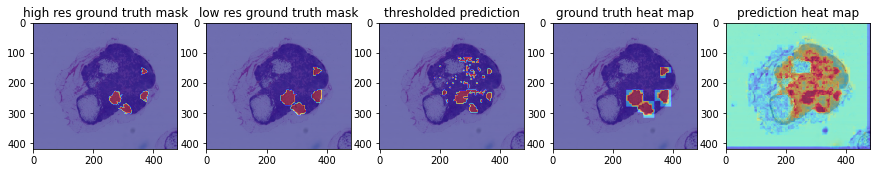

In [53]:
filename = TEST_FILES[1]
slide_ = open_slide(filename)
mask_ = open_slide(filename.split('.')[0]+'_mask.tif')

CONF_THRESH = 0.8
print('   //////////////////////////   tau = ' ,  CONF_THRESH,'   //////////////////////////   ' )
#slide_heat_map(slide_, mask_, [7,LEVELS[-2],LEVELS[-1]], models=[None, models[-2], models[-1]])
slide_heat_map(slide_, mask_, [7, LEVELS[-3], LEVELS[-2],LEVELS[-1]], models=[None, models[-3], models[-2], models[-1]], conf_thresh=0.85)

   //////////////////////////   tau =  0.73    //////////////////////////   
@@@@@@@@ 7 @@@@@@@@@@@
@@@@@@@@ 3 @@@@@@@@@@@
@@@@@@@@ 2 @@@@@@@@@@@
@@@@@@@@ 1 @@@@@@@@@@@
max confidence :  0.7220609684785206
min confidence :  2.357614928038108e-07


high res iou :  0.49995455
high res F1 :  0.0
high res precision :  0.0
high res recall :  0.0

 @@@@@@@@@@@@@@  

low res iou :  0.4998182
low res F1 :  0.0
low res precision :  0.0
low res recall :  0.0


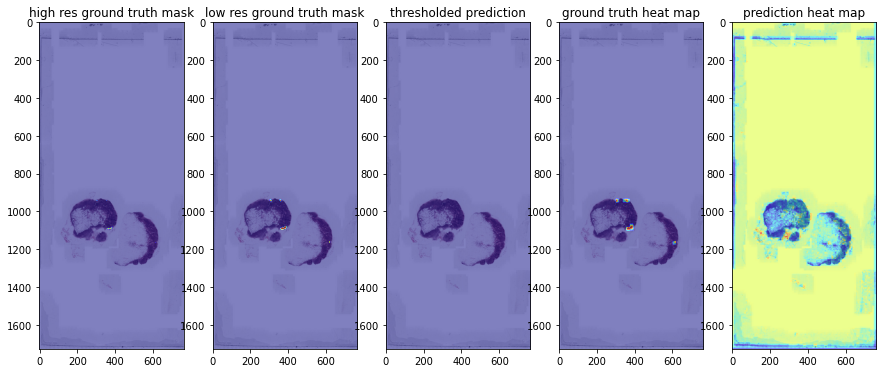

In [52]:
filename = TEST_FILES[2]
slide_ = open_slide(filename)
mask_ = open_slide(filename.split('.')[0]+'_mask.tif')

CONF_THRESH = 0.73
print('   //////////////////////////   tau = ' ,  CONF_THRESH,'   //////////////////////////   ' )
#slide_heat_map(slide_, mask_, [7,LEVELS[-2],LEVELS[-1]], models=[None, models[-2], models[-1]], conf_thresh=0.5)
slide_heat_map(slide_, mask_, [7, LEVELS[-3], LEVELS[-2],LEVELS[-1]], models=[None, models[-3], models[-2], models[-1]])

In [ ]:
# sanity check
filename = 'tumor_110.tif' # used in training 
slide_ = open_slide(filename)
mask_ = open_slide(filename.split('.')[0]+'_mask.tif')

CONF_THRESH = 0.8
print('   //////////////////////////   tau = ' ,  CONF_THRESH,'   //////////////////////////   ' )
slide_heat_map(slide_, mask_, [7, LEVELS[-3], LEVELS[-2],LEVELS[-1]], models=[None, models[-3], models[-2], models[-1]])

In [ ]:
# sanity check
filename = 'tumor_094.tif' # used in training 
slide_ = open_slide(filename)
mask_ = open_slide(filename.split('.')[0]+'_mask.tif')

CONF_THRESH = 0.8
print('   //////////////////////////   tau = ' ,  CONF_THRESH,'   //////////////////////////   ' )
slide_heat_map(slide_, mask_, [7, LEVELS[-3], LEVELS[-2],LEVELS[-1]], models=[None, models[-3], models[-2], models[-1]])

In [ ]:
# sanity check
filename = 'tumor_084.tif' # used in training 
slide_ = open_slide(filename)
mask_ = open_slide(filename.split('.')[0]+'_mask.tif')

CONF_THRESH = 0.8
print('   //////////////////////////   tau = ' ,  CONF_THRESH,'   //////////////////////////   ' )
slide_heat_map(slide_, mask_, [7, LEVELS[-3], LEVELS[-2],LEVELS[-1]], models=[None, models[-3], models[-2], models[-1]])

In [ ]:
# sanity check
filename = 'tumor_001.tif' # used in training 
slide_ = open_slide(filename)
mask_ = open_slide(filename.split('.')[0]+'_mask.tif')

CONF_THRESH = 0.8
print('   //////////////////////////   tau = ' ,  CONF_THRESH,'   //////////////////////////   ' )
slide_heat_map(slide_, mask_, [7, LEVELS[-3], LEVELS[-2],LEVELS[-1]], models=[None, models[-3], models[-2], models[-1]])

In [ ]:
#############################################################
# if you did want to combine with a fully connected layer, here's how:
#############################################################



#inputs = tf.keras.Input(shape=(1, len(LEVELS)))
#otuputs = tf.keras.layers.Dense(len(LEVELS), activation='sigmoid')
#mutli_model = tf.keras.Model(inputs, outputs)

# for N iterations:
  #x1 = models[0](x1, training=False)
  #x2 = models[1](x2, training=False)
  #x3 = models[2](x3, training=False)
  # find y_i from the mask slide of x_i
  # switch models to return logits ... 
  #multi_model.train_on_batch(x=[x1,x2,x3], y=[y1,y2,y3])